# What is YOLO
- Reference：https://encord.com/blog/yolo-object-detection-guide/


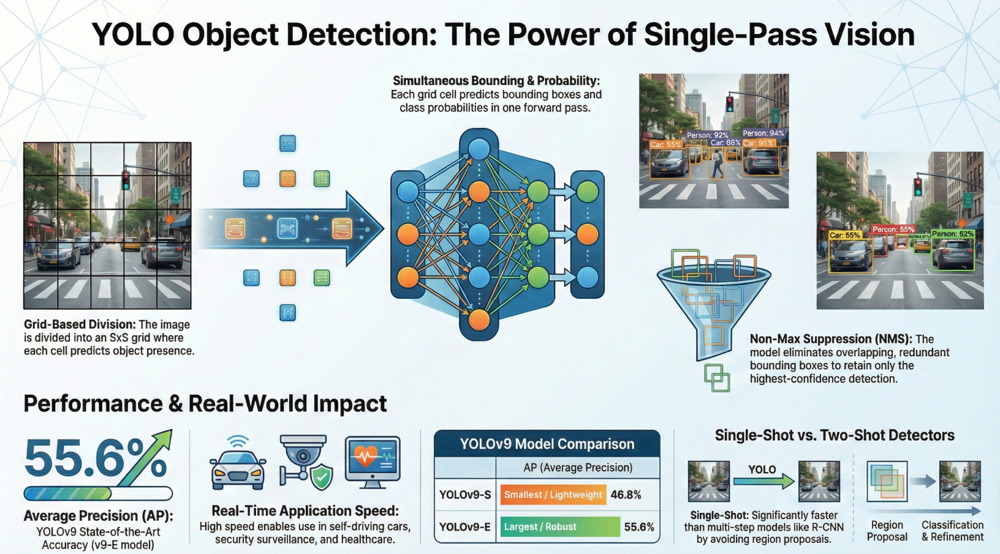

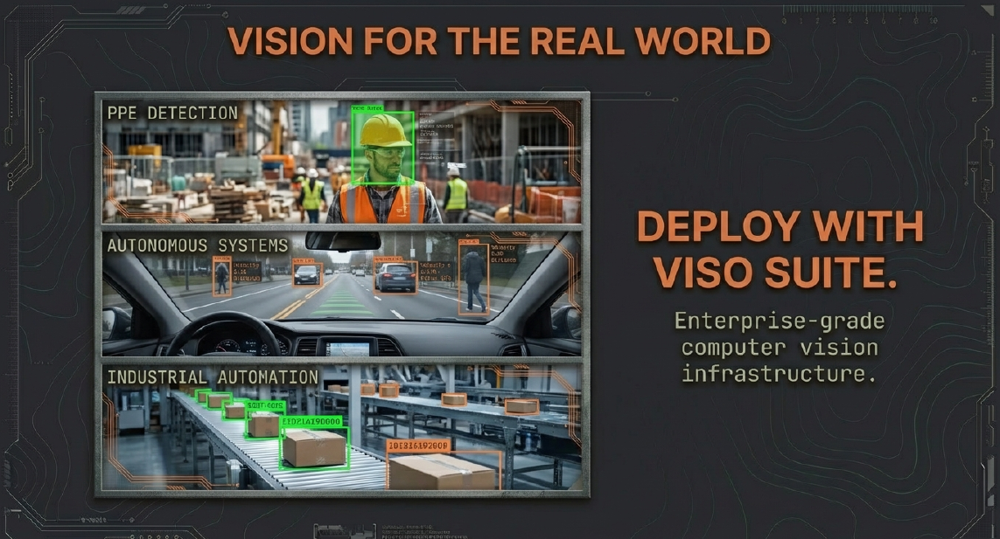

### YOLO Evolution


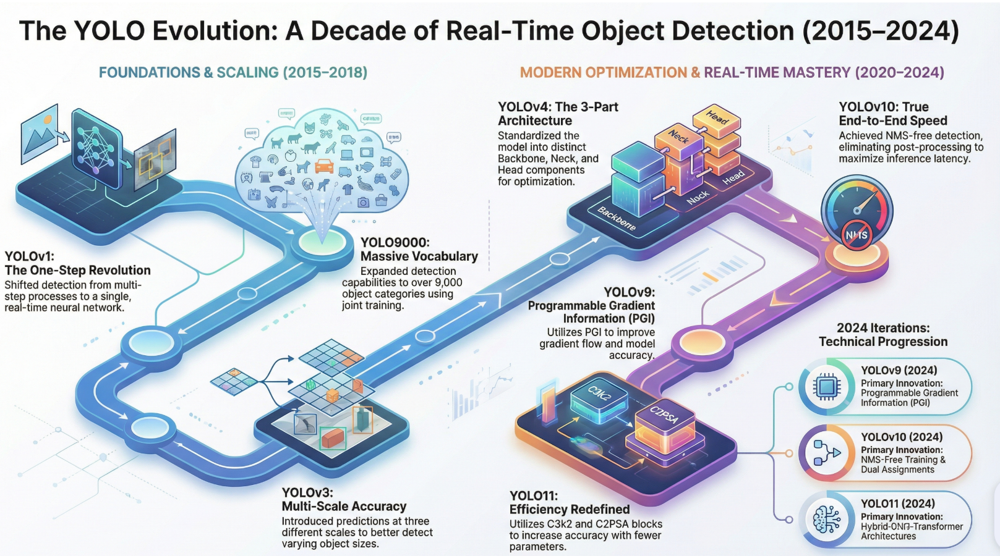

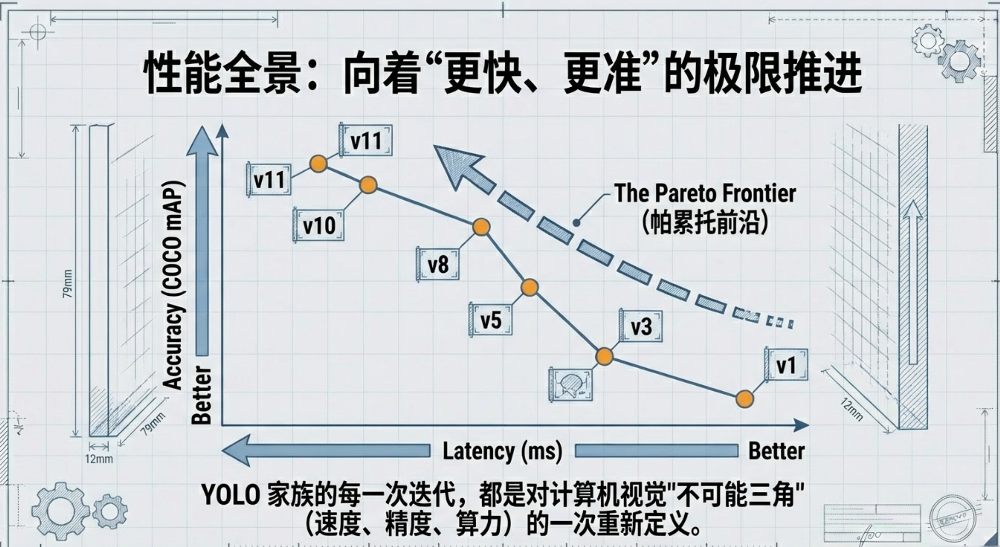

# 第1课：震撼开场 - YOLO能做什么？
https://encord.com/blog/yolo-object-detection-guide/

## 课程目标
- 让学生直观感受YOLO的强大功能
- 建立学习兴趣和信心
- 理解YOLO的基本工作方式
- **引出贯穿案例**：发现YOLO无法识别口罩

## 贯穿案例介绍：口罩检测项目

在接下来的9节课中，我们将完成一个完整的口罩检测项目：
1. **第1课**：发现预训练YOLO无法识别口罩 ← 你现在在这里
2. **第2课**：理解为什么（COCO数据集不包含）
3. **第3-4课**：获取和准备口罩检测数据集
4. **第5-6课**：训练自己的口罩检测模型
5. **第7课**：评估和优化模型性能
6. **第8-9课**：扩展到分割、姿态、跟踪

**为什么选择口罩检测？**
- ✅ COCO数据集不包含（预训练模型无法识别）
- ✅ 有实际应用价值（公共安全、疫情防控）
- ✅ 数据易获取（Roboflow有公开数据集）
- ✅ 识别难度适中（适合教学）

## 1. 环境准备与安装

首先，让我们安装必要的库。

In [ ]:
# 安装Ultralytics YOLO库
!pip install ultralytics opencv-python-headless pillow matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 7.8 MB/s eta 0:00:00


In [ ]:
# 导入必要的库
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# 检查是否有GPU可用
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
else:
    print("Running on CPU (Colab: make sure to enable GPU runtime)")

PyTorch version: 2.9.0+cu126
CUDA available: True
CUDA device: Tesla T4


## 2. 加载预训练YOLO模型

YOLOv8提供了5种不同大小的模型：
- **Nano (n)**: 最小最快，适合边缘设备
- **Small (s)**: 平衡速度和精度
- **Medium (m)**: 中等性能
- **Large (l)**: 高精度
- **Extra Large (x)**: 最高精度

我们先使用Nano模型进行快速演示。

In [ ]:
# 加载预训练的YOLOv8 Nano模型
# 第一次运行会自动下载模型文件（约6MB）
model = YOLO('yolov8n.pt')

print("✅ Model loaded Successfuly！")
print(f"Model Type: YOLOv8 Nano")
print(f"Parameters: 3.2M")
print(f"Trained Dataset: COCO (80 calsses)")

✅ 模型加载成功！
模型类型: YOLOv8 Nano
参数量: 3.2M
训练数据集: COCO (80个类别)


## 3. YOLO能识别什么？COCO数据集的80个类别

YOLO预训练模型在COCO数据集上训练，可以识别80个类别的物体。让我们看看都有哪些类别。

In [ ]:
{
  "class": {
    "0": "person",
    "1": "bicycle",
    "2": "car",
    "3": "motorcycle",
    "4": "airplane",
    "5": "bus",
    "6": "train",
    "7": "truck",
    "8": "boat",
    "9": "traffic light",
    "10": "fire hydrant",
    "11": "stop sign",
    "12": "parking meter",
    "13": "bench",
    "14": "bird",
    "15": "cat",
    "16": "dog",
    "17": "horse",
    "18": "sheep",
    "19": "cow",
    "20": "elephant",
    "21": "bear",
    "22": "zebra",
    "23": "giraffe",
    "24": "backpack",
    "25": "umbrella",
    "26": "handbag",
    "27": "tie",
    "28": "suitcase",
    "29": "frisbee",
    "30": "skis",
    "31": "snowboard",
    "32": "sports ball",
    "33": "kite",
    "34": "baseball bat",
    "35": "baseball glove",
    "36": "skateboard",
    "37": "surfboard",
    "38": "tennis racket",
    "39": "bottle",
    "40": "wine glass",
    "41": "cup",
    "42": "fork",
    "43": "knife",
    "44": "spoon",
    "45": "bowl",
    "46": "banana",
    "47": "apple",
    "48": "sandwich",
    "49": "orange",
    "50": "brocolli",
    "51": "carrot",
    "52": "hot dog",
    "53": "pizza",
    "54": "donut",
    "55": "cake",
    "56": "chair",
    "57": "couch",
    "58": "potted plant",
    "59": "bed",
    "60": "dining table",
    "61": "toilet",
    "62": "tv",
    "63": "laptop",
    "64": "mouse",
    "65": "remote",
    "66": "keyboard",
    "67": "cell phone",
    "68": "microwave",
    "69": "oven",
    "70": "toaster",
    "71": "sink",
    "72": "refrigerator",
    "73": "book",
    "74": "clock",
    "75": "vase",
    "76": "scissors",
    "77": "teddy bear",
    "78": "hair drier",
    "79": "toothbrush"
  }
}

In [ ]:
# 显示COCO数据集的所有类别
class_names = model.names
print(f"COCO Dataset includes {len(class_names)} Classes：\n")

# 按类别ID排序并分组显示
categories = {
    "Human": [0],  # person
    "Vehicle": [1, 2, 3, 4, 5, 6, 7, 8],  # bicycle, car, motorcycle, airplane, bus, train, truck, boat
    "Animals": [14, 15, 16, 17, 18, 19, 20, 21, 22, 23],  # bird, cat, dog, horse, sheep, cow, elephant, bear, zebra, giraffe
    "Furnitures": [56, 57, 58, 59, 60, 61, 62, 63],  # chair, couch, potted plant, bed, dining table, toilet, tv, laptop
    "Food": [46, 47, 48, 49, 50, 51, 52, 53],  # banana, apple, sandwich, orange, broccoli, carrot, hot dog, pizza
    "Sports": [32, 33, 34, 35, 36],  # sports ball, kite, baseball bat, baseball glove, skateboard
}

for category, ids in categories.items():
    items = [f"{id}:{class_names[id]}" for id in ids if id in class_names]
    print(f"\n{category}:")
    print("  " + ", ".join(items))

print("\nFull List：")
for i, name in class_names.items():
    print(f"{i:2d}: {name}", end="  ")
    if (i + 1) % 5 == 0:
        print()  # change line on every 5

print("\n\n⚠️ There is no 'mask' class here！")
print("This is why we need train our own model later。")

COCO数据集包含 80 个类别：


人物:
  0:person

交通工具:
  1:bicycle, 2:car, 3:motorcycle, 4:airplane, 5:bus, 6:train, 7:truck, 8:boat

动物:
  14:bird, 15:cat, 16:dog, 17:horse, 18:sheep, 19:cow, 20:elephant, 21:bear, 22:zebra, 23:giraffe

家具:
  56:chair, 57:couch, 58:potted plant, 59:bed, 60:dining table, 61:toilet, 62:tv, 63:laptop

食物:
  46:banana, 47:apple, 48:sandwich, 49:orange, 50:broccoli, 51:carrot, 52:hot dog, 53:pizza

运动器材:
  32:sports ball, 33:kite, 34:baseball bat, 35:baseball glove, 36:skateboard

完整列表：
 0: person   1: bicycle   2: car   3: motorcycle   4: airplane  
 5: bus   6: train   7: truck   8: boat   9: traffic light  
10: fire hydrant  11: stop sign  12: parking meter  13: bench  14: bird  
15: cat  16: dog  17: horse  18: sheep  19: cow  
20: elephant  21: bear  22: zebra  23: giraffe  24: backpack  
25: umbrella  26: handbag  27: tie  28: suitcase  29: frisbee  
30: skis  31: snowboard  32: sports ball  33: kite  34: baseball bat  
35: baseball glove  36: skateboard  37: surf

## 4. 下载演示图片和视频

让我们下载一些示例图片来测试YOLO。

**推荐的测试图片来源：**
- Unsplash / Pexels（免费高质量图片）
- COCO数据集示例图片
- 自己拍摄的照片

**手动下载链接（如果自动下载失败）：**
1. 街景图片：https://images.pexels.com/photos/1149831/pexels-photo-1149831.jpeg
2. 运动场景：https://images.pexels.com/photos/274422/pexels-photo-274422.jpeg
3. 办公室场景：https://images.pexels.com/photos/1181406/pexels-photo-1181406.jpeg
4. **戴口罩的人群**（关键！）：https://images.unsplash.com/photo-1584036561584-b03c19da874c

In [ ]:
# Create 'demo_images' Directory
os.makedirs('../demo_images', exist_ok=True)

# Download Images
import urllib.request

image_urls = {
    'street.jpg': 'https://images.pexels.com/photos/1149831/pexels-photo-1149831.jpeg?auto=compress&cs=tinysrgb&w=640',
    'sports.jpg': 'https://images.pexels.com/photos/274422/pexels-photo-274422.jpeg?auto=compress&cs=tinysrgb&w=640',
    'office.jpg': 'https://images.pexels.com/photos/1181406/pexels-photo-1181406.jpeg?auto=compress&cs=tinysrgb&w=640',
    'people_with_masks.jpg': 'https://images.unsplash.com/photo-1584036561584-b03c19da874c?w=640&q=80',
}

print("Downloading Demo Images...")
for filename, url in image_urls.items():
    filepath = f'../demo_images/{filename}'
    if not os.path.exists(filepath):
        try:
            urllib.request.urlretrieve(url, filepath)
            print(f"✅ Download OK: {filename}")
        except Exception as e:
            print(f"❌ Download Failed: {filename} - {e}")
            print(f"   please download Manualy: {url}")
    else:
        print(f"✓ Alreadt Exists: {filename}")

print("\n如果自动下载失败，请手动下载上述链接的图片到 demo_images/ 文件夹")

下载演示图片...
❌ 下载失败: street.jpg - HTTP Error 403: Forbidden
   请手动下载: https://images.pexels.com/photos/1149831/pexels-photo-1149831.jpeg?auto=compress&cs=tinysrgb&w=640
❌ 下载失败: sports.jpg - HTTP Error 403: Forbidden
   请手动下载: https://images.pexels.com/photos/274422/pexels-photo-274422.jpeg?auto=compress&cs=tinysrgb&w=640
❌ 下载失败: office.jpg - HTTP Error 403: Forbidden
   请手动下载: https://images.pexels.com/photos/1181406/pexels-photo-1181406.jpeg?auto=compress&cs=tinysrgb&w=640
❌ 下载失败: people_with_masks.jpg - HTTP Error 404: Not Found
   请手动下载: https://images.unsplash.com/photo-1584036561584-b03c19da874c?w=640&q=80

如果自动下载失败，请手动下载上述链接的图片到 demo_images/ 文件夹


## 5. 第一次YOLO检测！

让我们在街景图片上运行YOLO检测，看看它能识别出什么。

🚀 Running YOLO Detection...

image 1/1 /content/yolo-demo-01.png: 384x640 3 persons, 14 cars, 1 truck, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


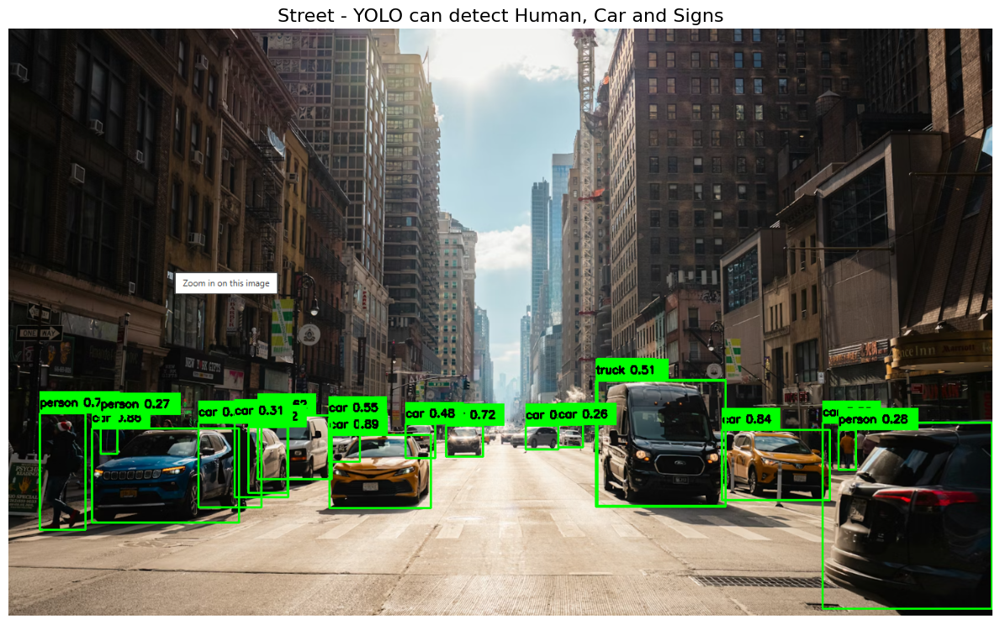


Detected 18 Objects：
  - car: 88.55%
  - car: 86.33%
  - car: 86.09%
  - car: 84.15%
  - person: 72.12%
  - car: 71.62%
  - car: 61.88%
  - car: 56.93%
  - car: 55.04%
  - truck: 50.92%
  - car: 47.75%
  - car: 35.23%
  - car: 32.50%
  - car: 32.21%
  - car: 30.62%
  - person: 27.90%
  - person: 26.70%
  - car: 26.25%


In [ ]:
# 辅助函数：显示检测结果
def display_results(image_path, results, title="YOLO Detection Results"):
    """
    Dispaly YOLO Detection Result
    """
    # Read Original Image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Results
    result = results[0]

    # Draw Detected Rectangle
    for box in result.boxes:
        # Get Coordinates for edges
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
        # Get Confidence
        conf = float(box.conf[0])
        cls = int(box.cls[0])
        label = f"{model.names[cls]} {conf:.2f}"

        # Draw Rectangle
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        # Draw Background of Label
        cv2.rectangle(img, (x1, y1-30), (x1+len(label)*10, y1), (0, 255, 0), -1)
        # Draw Text
        cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)

    # Display Image
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.title(title, fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Print Info
    print(f"\nDetected {len(result.boxes)} Objects：")
    for box in result.boxes:
        cls = int(box.cls[0])
        conf = float(box.conf[0])
        print(f"  - {model.names[cls]}: {conf:.2%}")

# Detect Street - street
image_path = '/content/yolo-demo-01.png'
if os.path.exists(image_path):
    print("🚀 Running YOLO Detection...")
    results = model(image_path, conf=0.25)  # conf=0.25 is threshold
    display_results(image_path, results, "Street - YOLO can detect Human, Car and Signs")
else:
    print(f"❌ Image is not exist: {image_path}")


## 6. 更多场景测试

让我们在不同场景下测试YOLO。


image 1/1 /content/yolo-demo-02.jpeg: 448x640 3 persons, 1 sports ball, 7.3ms
Speed: 1.6ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 36816 (\N{CJK UNIFIED IDEOGRAPH-8FD0}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 21160 (\N{CJK UNIFIED IDEOGRAPH-52A8}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 22330 (\N{CJK UNIFIED IDEOGRAPH-573A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 26223 (\N{CJK UNIFIED IDEOGRAPH-666F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 33021 (\N{CJK UNIFIED IDEOGRAPH-80FD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 35782 (\N{CJK UNIFIED IDEOGRAPH-8BC6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 21035 (\N{CJK UNIFIED IDEOGRAPH-522B}) missi

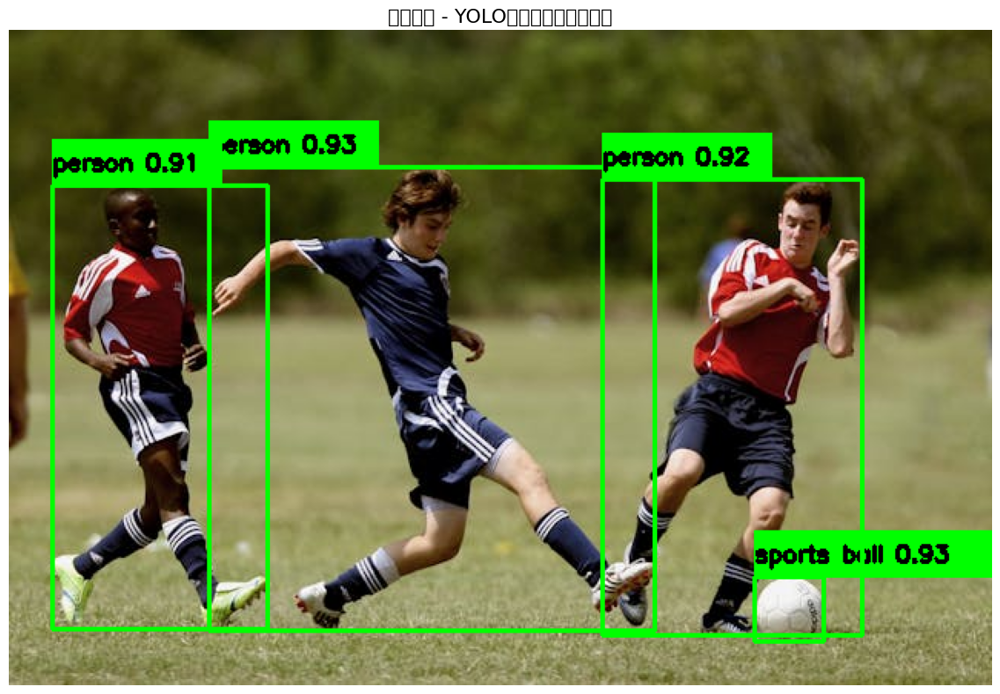


Detected 4 Objects：
  - sports ball: 93.06%
  - person: 92.89%
  - person: 91.78%
  - person: 91.03%

image 1/1 /content/yolo-demo-03.jpeg: 448x640 14 persons, 1 bottle, 6 chairs, 1 dining table, 3 laptops, 1 cell phone, 8.4ms
Speed: 1.4ms preprocess, 8.4ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 21150 (\N{CJK UNIFIED IDEOGRAPH-529E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 20844 (\N{CJK UNIFIED IDEOGRAPH-516C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 23460 (\N{CJK UNIFIED IDEOGRAPH-5BA4}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 23478 (\N{CJK UNIFIED IDEOGRAPH-5BB6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 20855 (\N{CJK UNIFIED IDEOGRAPH-5177}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 12289 (\N{IDEOGRAPHIC COMMA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 30005 (\N{CJK UNIFIED IDEOGRAPH-7535}) missing from f

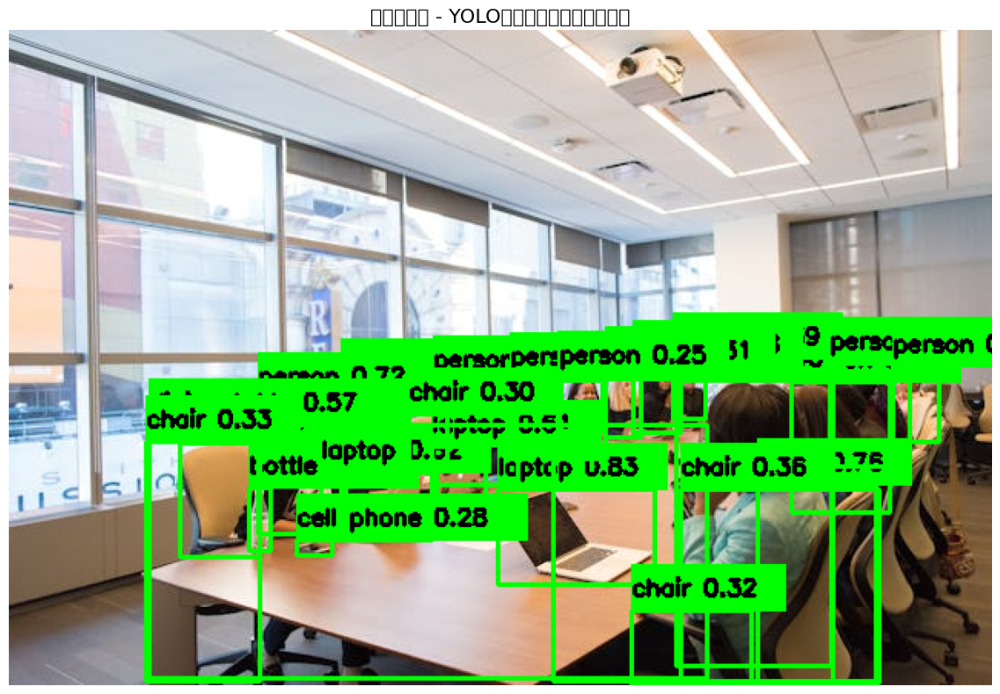


Detected 26 Objects：
  - chair: 84.96%
  - laptop: 82.97%
  - person: 81.13%
  - bottle: 78.49%
  - chair: 76.28%
  - person: 71.75%
  - person: 65.87%
  - person: 64.04%
  - laptop: 62.22%
  - laptop: 60.82%
  - dining table: 56.94%
  - person: 52.79%
  - person: 46.54%
  - person: 43.51%
  - person: 39.51%
  - person: 39.18%
  - person: 37.76%
  - chair: 36.20%
  - person: 35.10%
  - chair: 33.36%
  - person: 31.61%
  - chair: 31.55%
  - person: 30.50%
  - chair: 30.05%
  - cell phone: 28.50%
  - person: 25.31%


In [ ]:
# Sports Detection
sports_path = '/content/yolo-demo-02.jpeg'
if os.path.exists(sports_path):
    results = model(sports_path, conf=0.25)
    display_results(sports_path, results, "Sports - YOLO Can recognize Sports Equipments and Human")

# Office Detection
office_path = '/content/yolo-demo-03.jpeg'
if os.path.exists(office_path):
    results = model(office_path, conf=0.25)
    display_results(office_path, results, "Office - YOLO Office")

## 7. 🎯 关键时刻：YOLO能识别口罩吗？

现在让我们测试**戴口罩的人群**图片，看看YOLO能否识别出口罩。

**这就是我们贯穿案例的起点！**

🔍 测试：YOLO能识别口罩吗？


image 1/1 /content/yolo-demo-04.png: 384x640 9 persons, 7.2ms
Speed: 2.2ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 25140 (\N{CJK UNIFIED IDEOGRAPH-6234}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 21475 (\N{CJK UNIFIED IDEOGRAPH-53E3}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 32617 (\N{CJK UNIFIED IDEOGRAPH-7F69}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 20154 (\N{CJK UNIFIED IDEOGRAPH-4EBA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 32676 (\N{CJK UNIFIED IDEOGRAPH-7FA4}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3241386879.py:34: UserWarning: Glyph 21482 (\N{CJK UNIFIED IDEOGRAPH-53EA}) missi

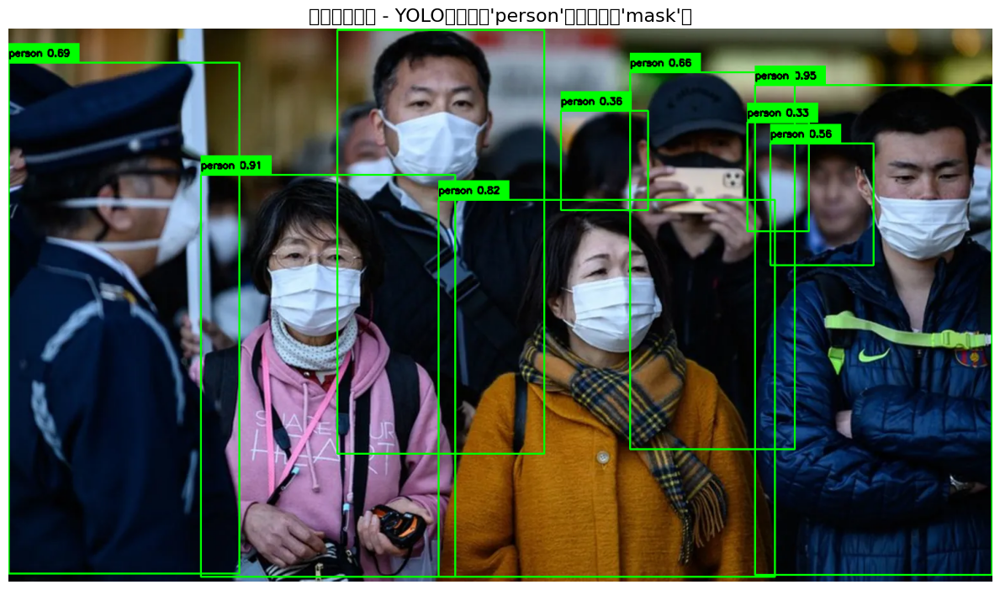


Detected 9 Objects：
  - person: 95.01%
  - person: 91.42%
  - person: 82.09%
  - person: 68.54%
  - person: 65.86%
  - person: 65.26%
  - person: 56.21%
  - person: 36.44%
  - person: 32.71%

⚠️  重要发现：
YOLO只能识别出 'person'（人），但无法识别：
  ❌ with_mask（戴口罩）
  ❌ without_mask（未戴口罩）
  ❌ mask_weared_incorrect（口罩佩戴不规范）

💡 这是因为COCO数据集不包含口罩相关的类别！

🎯 接下来的课程中，我们将：
  1. 收集口罩检测数据集
  2. 标注数据
  3. 训练自己的YOLO口罩检测模型
  4. 实现口罩佩戴情况的实时监控


In [ ]:
# 检测戴口罩的人群
mask_path = '/content/yolo-demo-04.png'
if os.path.exists(mask_path):
    print("🔍 测试：YOLO能识别口罩吗？\n")
    results = model(mask_path, conf=0.25)
    display_results(mask_path, results, "戴口罩的人群 - YOLO只能识别'person'，无法识别'mask'！")

    print("\n" + "="*60)
    print("⚠️  重要发现：")
    print("="*60)
    print("YOLO只能识别出 'person'（人），但无法识别：")
    print("  ❌ with_mask（戴口罩）")
    print("  ❌ without_mask（未戴口罩）")
    print("  ❌ mask_weared_incorrect（口罩佩戴不规范）")
    print("\n💡 这是因为COCO数据集不包含口罩相关的类别！")
    print("\n🎯 接下来的课程中，我们将：")
    print("  1. 收集口罩检测数据集")
    print("  2. 标注数据")
    print("  3. 训练自己的YOLO口罩检测模型")
    print("  4. 实现口罩佩戴情况的实时监控")
    print("="*60)
else:
    print(f"❌ 图片不存在: {mask_path}")
    print("请下载戴口罩的人群图片进行测试")

## 8. 理解YOLO的输出

让我们深入了解YOLO的检测结果包含哪些信息。

In [ ]:
# 详细分析检测结果
if os.path.exists(mask_path):
    results = model(mask_path, conf=0.25)
    result = results[0]

    print("YOLO检测结果详解：\n")
    print(f"图片尺寸: {result.orig_shape}")
    print(f"检测到的物体数量: {len(result.boxes)}\n")

    for i, box in enumerate(result.boxes):
        print(f"物体 #{i+1}:")

        # 边界框坐标（XYXY格式：左上角+右下角）
        xyxy = box.xyxy[0].cpu().numpy()
        print(f"  边界框坐标 (x1,y1,x2,y2): ({xyxy[0]:.1f}, {xyxy[1]:.1f}, {xyxy[2]:.1f}, {xyxy[3]:.1f})")

        # 中心点坐标和宽高（XYWH格式）
        xywh = box.xywh[0].cpu().numpy()
        print(f"  中心点+宽高 (x,y,w,h): ({xywh[0]:.1f}, {xywh[1]:.1f}, {xywh[2]:.1f}, {xywh[3]:.1f})")

        # 置信度分数
        conf = float(box.conf[0])
        print(f"  置信度: {conf:.2%}")

        # 类别ID和名称
        cls = int(box.cls[0])
        print(f"  类别ID: {cls}")
        print(f"  类别名称: {model.names[cls]}")
        print()


image 1/1 /content/yolo-demo-04.png: 384x640 9 persons, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
YOLO检测结果详解：

图片尺寸: (864, 1536)
检测到的物体数量: 9

物体 #1:
  边界框坐标 (x1,y1,x2,y2): (1165.7, 89.7, 1535.1, 853.7)
  中心点+宽高 (x,y,w,h): (1350.4, 471.7, 369.4, 764.0)
  置信度: 95.01%
  类别ID: 0
  类别名称: person

物体 #2:
  边界框坐标 (x1,y1,x2,y2): (300.5, 229.4, 698.0, 856.4)
  中心点+宽高 (x,y,w,h): (499.2, 542.9, 397.4, 626.9)
  置信度: 91.42%
  类别ID: 0
  类别名称: person

物体 #3:
  边界框坐标 (x1,y1,x2,y2): (671.8, 268.1, 1196.2, 856.4)
  中心点+宽高 (x,y,w,h): (934.0, 562.2, 524.4, 588.3)
  置信度: 82.09%
  类别ID: 0
  类别名称: person

物体 #4:
  边界框坐标 (x1,y1,x2,y2): (0.5, 54.6, 360.7, 851.5)
  中心点+宽高 (x,y,w,h): (180.6, 453.1, 360.2, 796.9)
  置信度: 68.54%
  类别ID: 0
  类别名称: person

物体 #5:
  边界框坐标 (x1,y1,x2,y2): (970.5, 69.0, 1227.9, 657.4)
  中心点+宽高 (x,y,w,h): (1099.2, 363.2, 257.4, 588.4)
  置信度: 65.86%
  类别ID: 0
  类别名称: person

物体 #6:
  边界框坐标 (x1,y1,x2,y2): (513.8, 3.3, 836.6, 664.7)

## 9. 视频检测（可选）

YOLO也可以处理视频。让我们看看如何在视频上运行检测。

**视频下载链接（如需手动下载）：**
- Pexels视频库：https://www.pexels.com/videos/
- 搜索关键词："people walking street" 或 "crowd"

In [ ]:
# 视频检测（需要视频文件）
video_path = '../demo_videos/crowd.mp4'

if os.path.exists(video_path):
    print("🎬 处理视频...")

    # 运行检测并保存结果
    results = model(video_path, save=True, conf=0.3)

    print("✅ 视频处理完成！")
    print("结果保存在: runs/detect/predict/")
else:
    print(f"视频文件不存在: {video_path}")
    print("\n💡 如何获取视频：")
    print("1. 从 https://www.pexels.com/videos/ 下载免费视频")
    print("2. 搜索 'people walking' 或 'crowd'")
    print("3. 下载并保存到 demo_videos/ 文件夹")
    print("4. 重新运行此单元格")
    print("\n或者使用自己的视频文件（支持mp4, avi, mov等格式）")

## 10. YOLO的三大核心概念

让我们理解YOLO是如何工作的。

### 10.1 什么是YOLO？

**YOLO = You Only Look Once（只看一次）**

- **传统方法**（如R-CNN）：
  1. 先用滑动窗口找可能的物体区域（慢）
  2. 再对每个区域分类（更慢）
  3. 总共需要几千次前向传播

- **YOLO方法**：
  1. 将图像分成网格（如13x13或19x19）
  2. 每个网格预测该位置的物体
  3. 只需要一次前向传播！
  4. 速度快100倍以上

### 10.2 YOLO的三大输出

对于每个检测到的物体，YOLO输出：

1. **边界框坐标** (x, y, width, height)
   - 告诉我们物体在哪里
   - 可以是绝对坐标或归一化坐标

2. **置信度分数** (0-1)
   - 表示"这里有物体"的信心程度
   - 0.25意味着25%的信心
   - 0.95意味着95%的信心

3. **类别概率分布** (80个类别的概率)
   - 告诉我们这是什么物体
   - 例如：person=0.92, dog=0.05, cat=0.03

### 10.3 非极大值抑制（NMS）

问题：同一个物体可能被多个网格检测到，产生多个重叠的框。

解决：NMS算法保留最好的框，抑制其他重叠的框。

步骤：
1. 按置信度排序所有检测框
2. 选择置信度最高的框
3. 删除与它IoU > 阈值（如0.5）的其他框
4. 重复直到处理完所有框

In [ ]:
# 可视化NMS的效果
if os.path.exists(mask_path):
    print("对比不同NMS阈值的效果：\n")

    # 高NMS阈值（保留更多框）
    results_high = model(mask_path, conf=0.25, iou=0.8)
    print(f"NMS阈值=0.8（宽松）: 检测到 {len(results_high[0].boxes)} 个物体")

    # 低NMS阈值（保留更少框）
    results_low = model(mask_path, conf=0.25, iou=0.3)
    print(f"NMS阈值=0.3（严格）: 检测到 {len(results_low[0].boxes)} 个物体")

    # 默认NMS阈值
    results_default = model(mask_path, conf=0.25, iou=0.7)
    print(f"NMS阈值=0.7（默认）: 检测到 {len(results_default[0].boxes)} 个物体")

    print("\n💡 NMS阈值越低，越激进地删除重叠框")

## 11. YOLO简史

让我们快速了解YOLO的发展历程。

### 发展时间线

| 版本 | 年份 | 关键特性 | mAP | 速度 |
|------|------|----------|-----|------|
| YOLOv1 | 2015 | 开创单阶段检测 | 63.4 | 45 FPS |
| YOLOv2 | 2016 | Batch Normalization, Anchor Boxes | 78.6 | 67 FPS |
| YOLOv3 | 2018 | 多尺度预测, 更深网络 | 57.9 | 30 FPS |
| YOLOv4 | 2020 | CSPDarknet53, Mosaic增强 | 43.5 | 65 FPS |
| YOLOv5 | 2020 | PyTorch实现, 易用性提升 | 56.8 | 140 FPS |
| **YOLOv8** | 2023 | C2f模块, 解耦头, 多任务支持 | 53.9 | 280 FPS |
| YOLO11 | 2024 | C3k2, C2PSA, 更少参数 | 54.7 | 270 FPS |

### YOLOv8的主要改进（我们使用的版本）

1. **架构优化**：
   - C2f模块（Cross Stage Partial with 2 convolutions）
   - 解耦头（Decoupled Head）分离分类和定位

2. **支持多种任务**：
   - 目标检测（Detection）
   - 实例分割（Segmentation）
   - 姿态估计（Pose Estimation）
   - 旋转框检测（OBB）
   - 图像分类（Classification）

3. **5种模型大小**：
   - Nano (n) - 3.2M参数
   - Small (s) - 11.2M参数
   - Medium (m) - 25.9M参数
   - Large (l) - 43.7M参数
   - Extra Large (x) - 68.2M参数

4. **易用性**：
   - 统一的API接口
   - 自动混合精度训练
   - 更好的文档和社区支持

## 12. 总结与下节课预告

### 本节课要点回顾

✅ **学到了什么：**
1. YOLO可以识别COCO数据集的80个类别
2. YOLO工作原理：单次前向传播，网格预测
3. YOLO输出：边界框、置信度、类别
4. NMS算法：去除重复检测框
5. **重要发现**：预训练YOLO无法识别口罩！

### 🎯 贯穿案例进度

- ✅ **第1课（今天）**：发现YOLO无法识别口罩
- 📋 **第2课**：深入理解YOLO能力边界
- 📋 **第3-4课**：准备口罩检测数据集
- 📋 **第5-6课**：训练口罩检测模型
- 📋 **第7课**：评估模型性能
- 📋 **第8-9课**：扩展应用

### 下节课预告：YOLO推理详解

在第2课中，我们将学习：
- 不同模型大小的对比（Nano vs Small vs Medium）
- 如何调整置信度和NMS阈值
- 批量处理图片和视频
- 查看完整的COCO类别列表
- **深入分析**：为什么YOLO无法识别口罩

### 课后作业

1. ✏️ 使用YOLO检测自己准备的5张图片
2. ✏️ 观察哪些物体能被准确识别，哪些不能
3. ✏️ 寻找3张包含口罩的图片，验证YOLO无法识别口罩
4. ✏️ 思考：你还想让YOLO识别哪些COCO没有的物体？

## 附加资源

### 推荐阅读
- [Ultralytics YOLOv8 官方文档](https://docs.ultralytics.com/)
- [COCO数据集官网](https://cocodataset.org/)
- [YOLOv8 GitHub仓库](https://github.com/ultralytics/ultralytics)

### 图片和视频资源
- [Pexels](https://www.pexels.com/) - 免费高质量图片和视频
- [Unsplash](https://unsplash.com/) - 免费摄影图片
- [Roboflow Universe](https://universe.roboflow.com/) - 公开数据集

### 下节课准备
- 下载更多测试图片（不同场景）
- 准备一个测试视频（可选）
- 思考你想训练的检测任务